<a href="https://colab.research.google.com/github/amirrezafahimi/Kaggle-Dog-breed-Classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook build an end-to-end multi-class image classifier using Tensorflow and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog. 

If given a photo of a dog, can our model predict the breed of it?

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

the Evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation 

## 4. Features

Some information about the data: 
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transger learning. 
* There are 120 breed of dogs (This means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip '/content/drive/My Drive/Dog Vision/dog-breed-identification_2.zip' -d '/content/drive/My Drive/Dog Vision'

### Get out workspace ready

* Import Tensorflow 2.x ✔
* Import Tensorflow Hub ✔
* Make sure we're using a GPU ✔

In [ ]:
# Import Tensorflow into Colab
import tensorflow as tf
print('TF version: ', tf.__version__)

# Import necessary tools
import tensorflow_hub as hub
print('TF Hub version: ', hub.__version__)

# Check for GPU availability
print('GPU', 'availabel' if tf.config.list_physical_devices('GPU') else 'not available')

TF version:  2.3.0
TF Hub version:  0.9.0
GPU availabel


## Getting our data ready (turning into Tensors) 

with all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/My Drive/Dog Vision/labels.csv')
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     c02f83947002646c705681ef6433294a  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


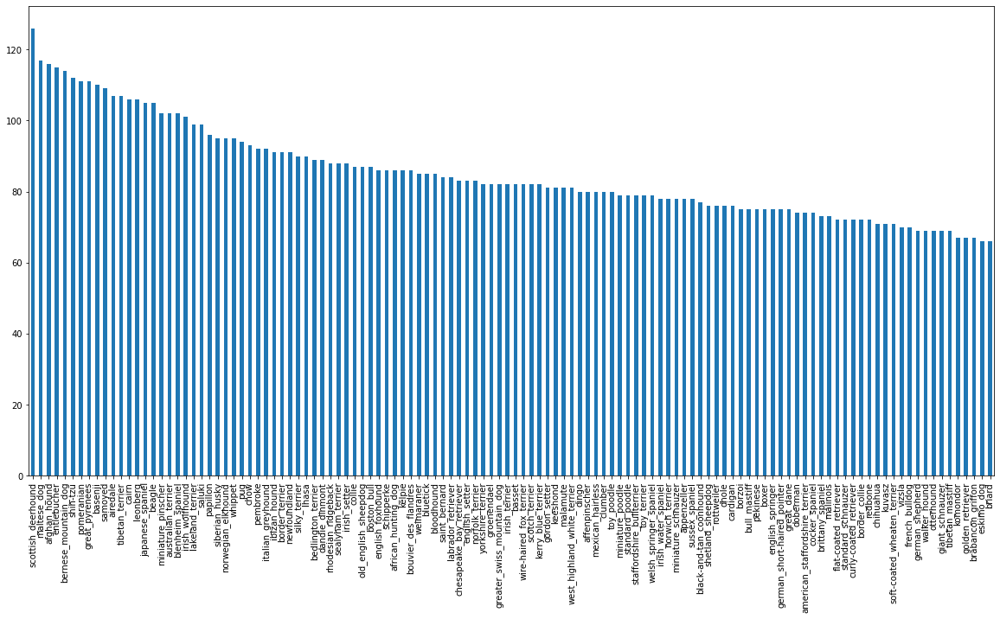

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

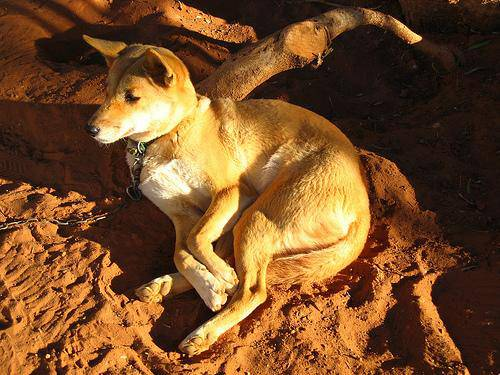

In [ ]:
# Let's view an image
from IPython.display import Image
Image('/content/drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels 

Let's get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ['/content/drive/My Drive/Dog Vision/train/' +  fname + '.jpg' for fname in labels_csv['id']]

In [ ]:
filenames[:10]

['/content/drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of file names matches number of actual image files
import os 
if len(os.listdir('drive/My Drive/Dog Vision/train/')) == len(filenames):
  print('Filenames match actual amount of files.')
else: 
  print('Filenames do not match actual amount of files.')

Filenames match actual amount of files.


Since we've now got our training image filepaths in a list, let's prepare our labels. 

In [ ]:
import numpy as np
labels = np.array(labels_csv['breed'])
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames): 
  print('Number of labels matches number of filenames')
else:
  print('Number of labels do not match number of filenames')

Number of labels matches number of filenames


In [ ]:
# Fine the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we should create our own.

In [ ]:
# Setup X & y variables 
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed. 

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES], 
                                                  test_size=.2, 
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
        

## Preprocessing images (turning images into tensors)

To preprocess our images into Tensors we're going to write a function which does the following things: 
1. Take an image file path as an input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a .jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, Let's see what importing an image looks like

In [ ]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into Tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.
1. Take an image file path as an input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a .jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns an image into Tensor.
  """

  # Read in an image file 
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches

Why turn our data into batches? 

Let's say your trying to process 10,000+ images in one go... they all might not fit into memory.

That's why we do about 32 (batch size) images at a time

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, 
  processes the image and returns a tuple of (image, label)
  """

  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches. 

In [ ]:
# Define the batch size, 32 is a good start
BATCHE_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCHE_SIZE, 
                        valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data: 
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                              tf.constant(y))) 
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  
  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                              tf.constant(y)))
    # Shuffle pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)    
    data = data.map(get_image_label)

    # Turn the training data into batches 
    data_batch = data.batch(batch_size)

    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand. Let's visualize them. 

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  # Setup the figure
  plt.figure(figsize=(12, 12))
  # Loop thourgh 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5, 5)    
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

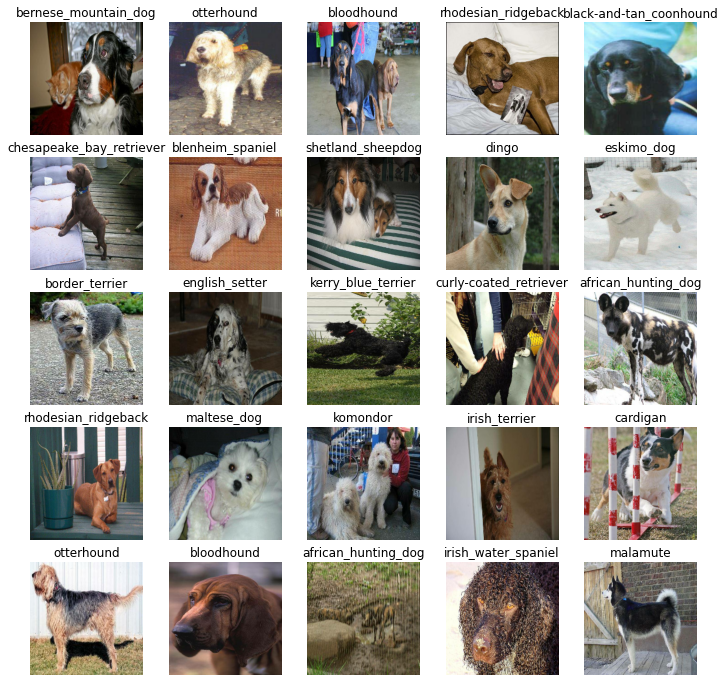

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

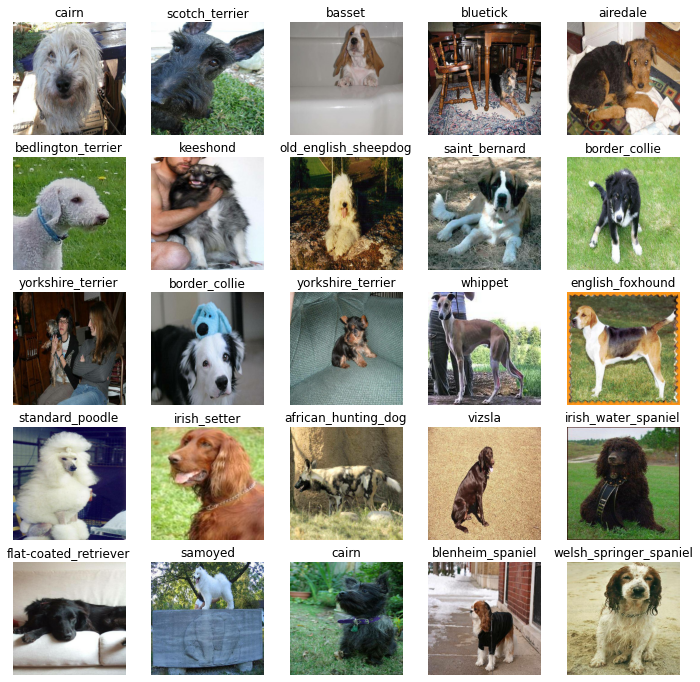

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use from Tensorflow Hub.

https://tfhub.dev/

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None , IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/resnet_v2_50/classification/4'

Now we've got our inputs, outputs and model ready to go. 
Let's put them together into a Keras deep learning model. 

Knowing this, let's create a function which: 
* Takes the input shape, output shape and the model we've chosen as parameters. 
* Defines the layers in a Keras model in a Sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and imporoved).
* Build the model (tells the model the input shape it'll be getting). 
* Returns the model.

All of these steps can be found here:
https://www.tensorflow.org/guid/keras/overview

In [ ]:
# Create a function which build a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL): 
  print('Building model with: ', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), 
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                                                     activation='softmax')
  ])            

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), 
      optimizer=tf.keras.optimizers.Adam(), 
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/resnet_v2_50/classification/4


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              25615849  
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 25,736,089
Trainable params: 120,240
Non-trainable params: 25,615,849
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving. 

We'll create two callbacks, one for Tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### Tensorboard Callback

To setup a Tensorboard callback, we need to do 3 things: 
1. Load the Tensorboard notebook extension ✔
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function ✔
3. Visualize our models training lodg with the `%tensorboard` magic function ✔

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboards log
  logdir = os.path.join('/content/drive/My Drive/Dog Vision/logs', 
                        datetime.datetime.now().strftime('%y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)  

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', 
                                                  patience=3)

## Creatin Tensor Dash 
Tensor Dashboard, you can find more about them in link below: 

https://github.com/CleanPegasus/TensorDash

In [ ]:
from tensordash.tensordash import Tensordash

def create_tensordash_callback():
  return Tensordash(
      ModelName='ResNet v50 1', 
      email='amirrezafahimi98@gmail.com',
      password='80619395533@Tensor'
  )

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working properly. 

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're running on a GPU
print('GPU', 'availabel' if tf.config.list_physical_devices('GPU') else 'not available')

GPU availabel


Let's create a function which trains a model. 

* Create a model using `create_model()`
* Setup a Tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  histories = create_tensordash_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data, 
            epochs=NUM_EPOCHS, 
            validation_data=val_data, 
            validation_freq=1, 
            callbacks=[tensorboard, early_stopping, histories])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/resnet_v2_50/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 8.1871 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 426s 17s/step - loss: 5.4289 - accuracy: 0.0900 - val_loss: 3.4878 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 4s 175ms/step - loss: 1.3880 - accuracy: 0.6325 - val_loss: 2.1776 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 176ms/step - loss: 0.4120 - accuracy: 0.9187 - val_loss: 1.8966 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 4s 171ms/step - loss: 0.1835 - accuracy: 0.9762 - val_loss: 1.8382 - val_accuracy: 0.5550
Epoch 5/100
25/25 [==============================] - 4s 175ms/step - loss: 0.1001 - accuracy: 0.9975 - val_loss: 1.7830 - val_accuracy: 0.5700
Epoch 6/100
25/25 [==============================] - 5s 189ms/step - loss: 0.0703 - accuracy: 0.9987 - val_loss: 1.7842 - val_accuracy: 0.5550
Epoch 7/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0538 - accuracy: 0.9987 - val_loss: 1.7766 - val_accuracy: 0.5650
Epoch 8/100

It looks like our model is overfitting because it's performing far better on the training datatset than validation dataset. 😒😒

### Checking the Tensorboard logs

The Tensorboard magic function (`%tensorboard`) will acess the logs direcotry we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 111ms/step


array([[6.1306806e-04, 9.6311502e-04, 6.9346032e-05, ..., 4.7841484e-05,
        1.9666291e-04, 7.6053099e-04],
       [3.0587682e-05, 5.1596755e-05, 1.3463144e-03, ..., 1.8828516e-07,
        5.0010767e-05, 4.7908111e-07],
       [6.8730501e-06, 1.3299630e-04, 7.0673747e-07, ..., 3.4349559e-05,
        4.6448957e-08, 8.9251335e-09],
       ...,
       [1.4369638e-07, 2.1081060e-04, 1.9813655e-05, ..., 3.1004547e-05,
        2.4729178e-04, 1.2916763e-06],
       [1.8388414e-04, 7.2881717e-06, 4.7240394e-07, ..., 1.8774317e-06,
        2.3389329e-07, 1.6417416e-03],
       [9.1840116e-07, 1.5544964e-08, 1.8597090e-07, ..., 8.3573505e-06,
        5.7575076e-06, 9.7983720e-06]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction probability): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[2.5308990e-08 2.3814900e-08 5.5165636e-08 2.1982564e-06 1.7004209e-05
 2.4596059e-07 1.5715191e-06 6.7617434e-06 4.3779676e-04 3.5279148e-04
 1.6033032e-06 9.2288144e-07 8.0876511e-05 7.3026717e-06 2.3729806e-05
 7.8106532e-06 1.7678020e-07 4.7667586e-06 1.7613980e-08 3.7928007e-07
 2.1198305e-06 5.5468181e-06 1.1018841e-09 1.8136750e-06 3.3299439e-04
 3.3926199e-08 7.9611882e-06 5.5992462e-07 3.3646796e-07 4.0188607e-07
 9.6084818e-07 7.0665394e-08 4.0473416e-09 5.1638022e-08 9.0432815e-07
 3.9669703e-09 1.9145915e-07 1.4825670e-06 1.9372571e-06 9.1905928e-01
 1.3117542e-06 2.7892335e-09 9.9383753e-05 3.2924811e-07 1.2362221e-06
 2.9553803e-07 4.1782728e-04 3.8105551e-05 1.6032175e-08 3.7196276e-06
 2.3519419e-07 5.8964938e-06 1.2330271e-07 1.9919464e-05 3.7060481e-08
 1.7335493e-06 1.5655984e-06 2.4754570e-07 4.2893571e-06 1.8644425e-06
 2.1901236e-07 1.4360170e-07 4.7275054e-07 3.6578325e-07 1.6497863e-06
 7.1441946e-08 1.1131131e-06 9.3067705e-05 2.1667221e-04 1.2290823e-07
 9.050

Having the above funcionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** prediction probabilities are known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to undrestand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.  
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'english_foxhound'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those to predictions labels (trush labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels.
  """  
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get: 
* Prediction labels
* Validation labels
* Validation images 

Let's make some functions to make these all a bit more visualize. 

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integer. 
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('Pred :{}, {:2.0f}%, Truth: {}'.format(pred_label, 
                                      np.max(pred_prob) * 100, 
                                      true_label), 
                                      color=color)

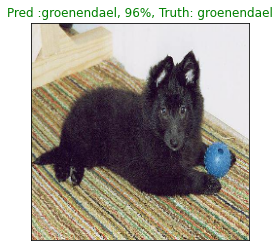

In [ ]:
plot_pred(prediction_probabilities=predictions, 
          labels=val_labels, 
          images=val_images, 
          n=77)

Now we've got one function to visualize our models predictions, let's make another to view our models to 10 predictinos.

The function will: 
* Take an input of prediction probabilities array and a ground truth array and an integer. 
* Find the predicted label using `get_pred_label()`
* Find the top 10: 
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plos the top 10 highest prediction confidences along with the truth label for samples n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values 
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)), 
             labels=top_10_pred_labels, 
             rotation='vertical')  
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else: pass

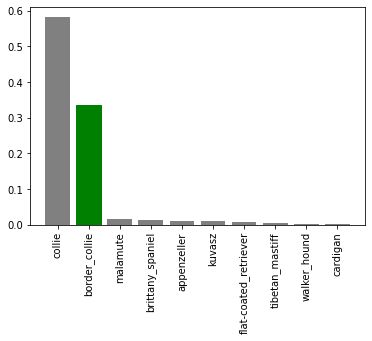

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, 
               labels=val_labels, 
               n=9)

Now we've got some functions to help use visualize our predictions and evaluate our model, let's check out a few. 

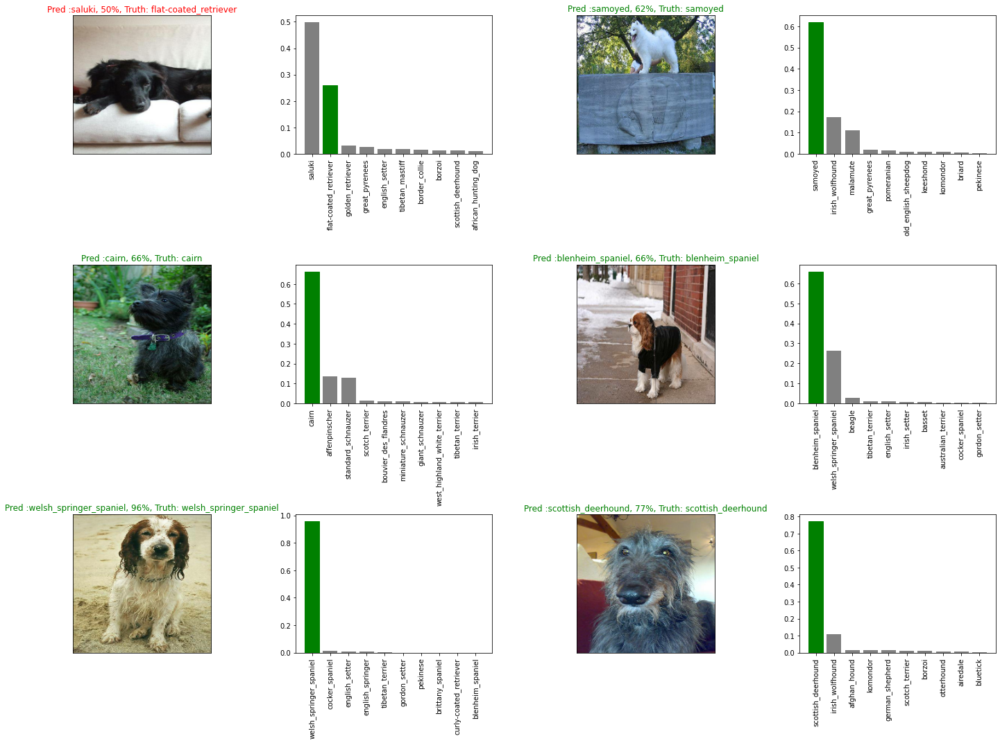

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities=predictions, 
            labels=val_labels, 
            images=val_images, 
            n=i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions, 
                 labels=val_labels, 
                 n = i + i_multiplier)
  plt.tight_layout(h_pad=1.0)  
plt.show()

## Saving and reloding a trained model



In [ ]:
# Create a function to save a model 
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/My Drive/Dog Vision/models', 
                          datetime.datetime.now().strftime('%Y%M%d-%H%M%s')) 
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')   
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={'KerasLayer': hub.KerasLayer})  
  return model    

Now we've got functions to save and load a trained model, Let's make sure they work.

In [ ]:
# Save our model trained on 1000 images 
save_model(model, suffix='100-images-resnetV50-adam')

Saving model to: /content/drive/My Drive/Dog Vision/models/20200422-14041603375495-100-images-resnetV50-adam.h5...


'/content/drive/My Drive/Dog Vision/models/20200422-14041603375495-100-images-resnetV50-adam.h5'

In [ ]:
# Load a trained model 
loaded_100_image_model = load_model('/content/drive/My Drive/Dog Vision/models/20200422-14041603375495-100-images-resnetV50-adam.h5')

Loading saved model from: /content/drive/My Drive/Dog Vision/models/20200422-14041603375495-100-images-resnetV50-adam.h5


In [ ]:
# Evaluate the pre-saved model
loaded_100_image_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.7452 - accuracy: 0.5950


[1.7451908588409424, 0.5950000286102295]

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 93ms/step - loss: 1.7452 - accuracy: 0.5950


[1.7451908588409424, 0.5950000286102295]

## Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/resnet_v2_50/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', 
                                                             patience=3)
# Tensordash
histories = create_tensordash_callback()

**Note:** Running the cell below will take a little while (may be up to an hour for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.  

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping, 
                          histories])

Epoch 1/100
  2/320 [..............................] - ETA: 1:09 - loss: 7.0323 - accuracy: 0.0312WARNING:tensorflow:Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0801s vs `on_train_batch_end` time: 0.3560s). Check your callbacks.


320/320 [==============================] - 52s 162ms/step - loss: 1.6795 - accuracy: 0.5985
Epoch 2/100
320/320 [==============================] - 54s 170ms/step - loss: 0.7163 - accuracy: 0.7860
Epoch 3/100
320/320 [==============================] - 53s 167ms/step - loss: 0.4926 - accuracy: 0.8434
Epoch 4/100
320/320 [==============================] - 52s 163ms/step - loss: 0.3590 - accuracy: 0.8819
Epoch 5/100
320/320 [==============================] - 52s 162ms/step - loss: 0.2659 - accuracy: 0.9175
Epoch 6/100
320/320 [==============================] - 52s 163ms/step - loss: 0.2038 - accuracy: 0.9361
Epoch 7/100
320/320 [==============================] - 53s 166ms/step - loss: 0.1664 - accuracy: 0.9483
Epoch 8/100
320/320 [==============================] - 54s 168ms/step - loss: 0.1312 - accuracy: 0.9595
Epoch 9/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0975 - accuracy: 0.9730
Epoch 10/100
320/320 [==============================] - 53s 165ms/step - los

In [ ]:
save_model(full_model, suffix='full-image-set-ResNetV2-50')

Saving model to: /content/drive/My Drive/Dog Vision/models/20203222-17321603387924-full-image-set-ResNetV2-50.h5...


'/content/drive/My Drive/Dog Vision/models/20203222-17321603387924-full-image-set-ResNetV2-50.h5'

In [203]:
# Load the full model
loaded_full_model = load_model('/content/drive/My Drive/Dog Vision/models/20201122-17111603386699-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/My Drive/Dog Vision/models/20201122-17111603386699-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as inputs and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to `predict()` method called on our model.

In [174]:
# Load test image filenames
test_path = '/content/drive/My Drive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/My Drive/Dog Vision/test/f409b8113b2c2ab861131c4bd1c0b029.jpg',
 '/content/drive/My Drive/Dog Vision/test/ed9a58ccecb053df2a38486a51501248.jpg',
 '/content/drive/My Drive/Dog Vision/test/ed574861296d0946948a4225e60e8d75.jpg',
 '/content/drive/My Drive/Dog Vision/test/f219fa279b770442dedbbe61ff5bcfd8.jpg',
 '/content/drive/My Drive/Dog Vision/test/eef2fd5db98424ae214e176a910e9e3b.jpg',
 '/content/drive/My Drive/Dog Vision/test/f35539d88ab6f98c2e4d8891e1de687c.jpg',
 '/content/drive/My Drive/Dog Vision/test/e9cee3bd9000422ec5e391c932da60f8.jpg',
 '/content/drive/My Drive/Dog Vision/test/f01df7641b237cd177d71fdb8db9bd58.jpg',
 '/content/drive/My Drive/Dog Vision/test/f14fea2fe647a06dce75eb19dbf1273f.jpg',
 '/content/drive/My Drive/Dog Vision/test/ed675fae47e3a3698277131065548e2f.jpg']

In [175]:
len(test_filenames)

10357

In [176]:
# Create test data batch 
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [177]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an hour) 

In [178]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, 
                                             verbose=1)

324/324 [==============================] - 42s 131ms/step


In [179]:
np.savetxt('/content/drive/My Drive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [180]:
test_predictions = np.loadtxt('/content/drive/My Drive/Dog Vision/preds_array.csv', delimiter=',')

In [181]:
test_predictions[:10]

array([[8.61534975e-12, 3.68538999e-09, 1.44688997e-10, ...,
        3.68039670e-12, 6.15580612e-13, 9.88551855e-01],
       [3.07389574e-12, 9.31787009e-11, 1.17616717e-14, ...,
        5.67573905e-11, 1.19167887e-09, 6.93533718e-13],
       [1.65033699e-11, 8.61937810e-09, 3.10540180e-08, ...,
        2.50632191e-08, 1.60210519e-07, 7.59969587e-10],
       ...,
       [4.36274543e-17, 1.14052510e-15, 9.29222804e-17, ...,
        8.00337675e-17, 1.46006096e-09, 2.64885956e-14],
       [1.65406107e-08, 3.01831915e-09, 1.32654138e-10, ...,
        4.70989932e-07, 4.12990886e-08, 1.66448211e-09],
       [1.32457023e-11, 1.71399131e-10, 6.36861119e-11, ...,
        5.28753958e-07, 7.13867943e-09, 1.63140044e-08]])

In [182]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we fine that it wants our models predictions probability outputs in a DataFrame with an id column and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas datagrame with and ID column as well as columns for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the predictions probabilities) to each of dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.


In [183]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [184]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [185]:
test_ids[:10]

['f409b8113b2c2ab861131c4bd1c0b029',
 'ed9a58ccecb053df2a38486a51501248',
 'ed574861296d0946948a4225e60e8d75',
 'f219fa279b770442dedbbe61ff5bcfd8',
 'eef2fd5db98424ae214e176a910e9e3b',
 'f35539d88ab6f98c2e4d8891e1de687c',
 'e9cee3bd9000422ec5e391c932da60f8',
 'f01df7641b237cd177d71fdb8db9bd58',
 'f14fea2fe647a06dce75eb19dbf1273f',
 'ed675fae47e3a3698277131065548e2f']

In [186]:
preds_df['id'] = test_ids

In [187]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f409b8113b2c2ab861131c4bd1c0b029,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ed9a58ccecb053df2a38486a51501248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ed574861296d0946948a4225e60e8d75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f219fa279b770442dedbbe61ff5bcfd8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,eef2fd5db98424ae214e176a910e9e3b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [188]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f409b8113b2c2ab861131c4bd1c0b029,8.61535e-12,3.68539e-09,1.44689e-10,3.13005e-18,2.81958e-14,5.55429e-15,1.60256e-10,5.76754e-07,1.53857e-10,7.7592e-09,1.74672e-10,1.54455e-10,2.48249e-10,0.000606995,1.39919e-18,8.75555e-14,1.41073e-09,1.26992e-11,3.79495e-12,1.22622e-13,1.32808e-11,1.83811e-10,2.6964e-11,1.42156e-13,2.11105e-09,1.95571e-10,7.96583e-13,9.62821e-13,3.01604e-14,0.00275518,1.21057e-14,1.44612e-13,2.01107e-14,8.25852e-10,4.88722e-12,8.53339e-11,5.9543e-15,1.09499e-14,8.50107e-15,...,8.36024e-14,1.59191e-07,4.78519e-17,2.79034e-17,6.85366e-07,0.0074122,3.29069e-08,3.04401e-05,3.62862e-12,1.17521e-16,4.01587e-05,1.33514e-08,2.41228e-11,5.02081e-09,3.4285e-11,7.84989e-15,5.50067e-11,8.49502e-13,4.08625e-20,0.000590963,4.16301e-07,9.44189e-07,7.39211e-10,1.33668e-09,1.02661e-11,4.54517e-11,2.94696e-16,2.55566e-13,1.93013e-19,6.82534e-09,2.64111e-07,1.36636e-08,1.38807e-07,1.44727e-11,2.22911e-13,2.14279e-06,4.97953e-13,3.6804e-12,6.15581e-13,0.988552
1,ed9a58ccecb053df2a38486a51501248,3.0739e-12,9.31787e-11,1.17617e-14,1.3136e-14,5.29435e-08,2.83327e-09,9.387e-14,6.15135e-12,8.64119e-10,6.71513e-10,1.05143e-11,3.14877e-11,8.71295e-14,4.71364e-14,2.97146e-11,1.52831e-13,2.42945e-10,3.45902e-11,1.20796e-13,3.07526e-13,1.35967e-16,2.72977e-13,2.9455e-16,5.49822e-11,3.41916e-15,2.94536e-11,9.33027e-11,2.92653e-13,2.70744e-12,2.21928e-14,1.09892e-10,9.24479e-12,2.22432e-10,3.24256e-08,6.47725e-15,3.68074e-12,1.04606e-10,8.99815e-17,4.10033e-13,...,1.93369e-12,2.89833e-08,1.45707e-11,3.46022e-08,5.87484e-13,1.52943e-14,7.09162e-16,1.67523e-15,1.10942e-11,6.96494e-13,8.13709e-13,1.00986e-13,2.35757e-15,1.67933e-11,2.56779e-12,5.21696e-11,3.12736e-14,5.11204e-06,3.11759e-10,6.12905e-17,1.852e-12,7.68539e-13,5.34333e-11,6.11092e-10,2.75263e-16,4.29258e-15,8.85651e-12,2.38785e-12,2.8669e-12,1.81596e-12,3.50498e-14,1.17991e-14,7.57538e-14,1.37602e-12,1.26983e-10,1.53037e-12,9.06523e-13,5.67574e-11,1.19168e-09,6.93534e-13
2,ed574861296d0946948a4225e60e8d75,1.65034e-11,8.61938e-09,3.1054e-08,1.85928e-10,3.23862e-10,1.04658e-12,9.9525e-06,4.13913e-11,2.45514e-06,4.07704e-11,2.23397e-09,2.7998e-09,1.2178e-11,6.15624e-12,2.59492e-10,2.70435e-11,1.06931e-08,1.25263e-06,2.16875e-13,1.01701e-10,2.36413e-06,3.23008e-10,2.06993e-10,1.48944e-08,1.79802e-08,1.03135e-10,3.01693e-06,7.80502e-07,2.34243e-09,1.22691e-10,9.43063e-09,4.93021e-09,3.44379e-12,2.61323e-08,2.79152e-11,3.4159e-07,8.16728e-08,1.32571e-11,9.19008e-09,...,2.50187e-11,0.289203,1.20821e-10,2.80517e-05,1.29972e-12,2.60349e-10,8.82478e-07,1.79098e-07,1.27566e-07,1.00107e-09,2.86088e-08,1.07961e-14,7.01897e-11,1.22985e-12,6.60661e-09,6.47946e-10,1.72718e-08,2.65914e-10,3.656e-10,7.6134e-13,6.33571e-10,3.82483e-10,3.67661e-09,1.48477e-07,2.01155e-09,9.95065e-09,4.22959e-10,1.18594e-08,1.16563e-10,1.72067e-09,3.71735e-09,3.20579e-10,5.92191e-10,1.4898e-10,1.25864e-08,3.22355e-10,3.24412e-

In [189]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/My Drive/Dog Vision/Resnet_model_submission.csv', 
                index=False)

## Making predictions 

To make predictions on custom images we'll: 
* Get the filepath of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custome images won't have labels we set the `test_data` parameter to `True`. 
* Pass the custome image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custome images.


In [208]:
custom_path = '/content/drive/My Drive/Dog Vision/my-custom-dogs/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [209]:
custom_image_paths

['/content/drive/My Drive/Dog Vision/my-custom-dogs/6WneSv56YVI.jpg',
 '/content/drive/My Drive/Dog Vision/my-custom-dogs/42cc205.jpg',
 '/content/drive/My Drive/Dog Vision/my-custom-dogs/Fk2DGAaZJGs.jpg']

In [210]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [211]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [213]:
custom_preds.shape

(3, 120)

In [215]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky', 'rottweiler', 'yorkshire_terrier']

In [216]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

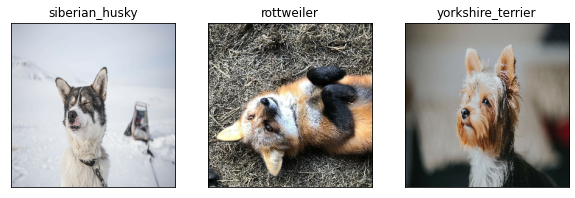

In [218]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [220]:
# Actually the image in the middle is a fox, I put it there on purpose just to test my model